# **Семинар 10**. Honey, I'm gonna do it in style

Сегодня рассмотрим два подхода для переноса стиля и будем делать стилизованные изображения.

В 2015 году Гатис с коллегами выдали статью [A Neural Algorithm of Artistic Style](https://arxiv.org/pdf/1508.06576.pdf) и понеслось.

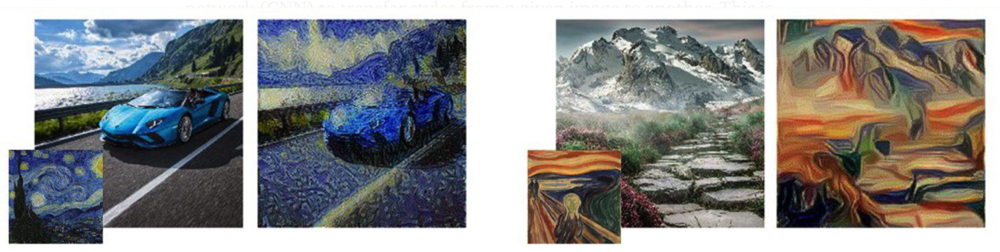

## **10.1** Медленный подход (optimization)


**Кратко**: имеем ImageNet-сеть и картинку стиля - **оптимизируем** желанную **картинку** (sic!) под нужный стиль

### **10.1.1** Говорим

**Что мы называем переносом стиля?**

Переносом стиля мы считаем процесс изменения стиля: изменение цветовой гаммы; размера, направление и текстуры мазков  входного изображения в соответствии со стилем изображения-стиля, сохраняя основной контент нашего изображения.

На самом деле наш медленный алгоритм будет работать с тремя изображениями:

  * `входное изображение` - может быть шум, но лучшие та же картинка-контент,
  * `изображение-контент` - источник сюжета,
  * `изображение-стиль`   - источник стиля.

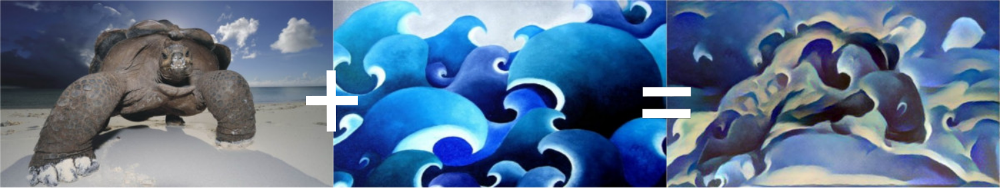

**Как используются нейронные сети при решении сформулированной задачи?**

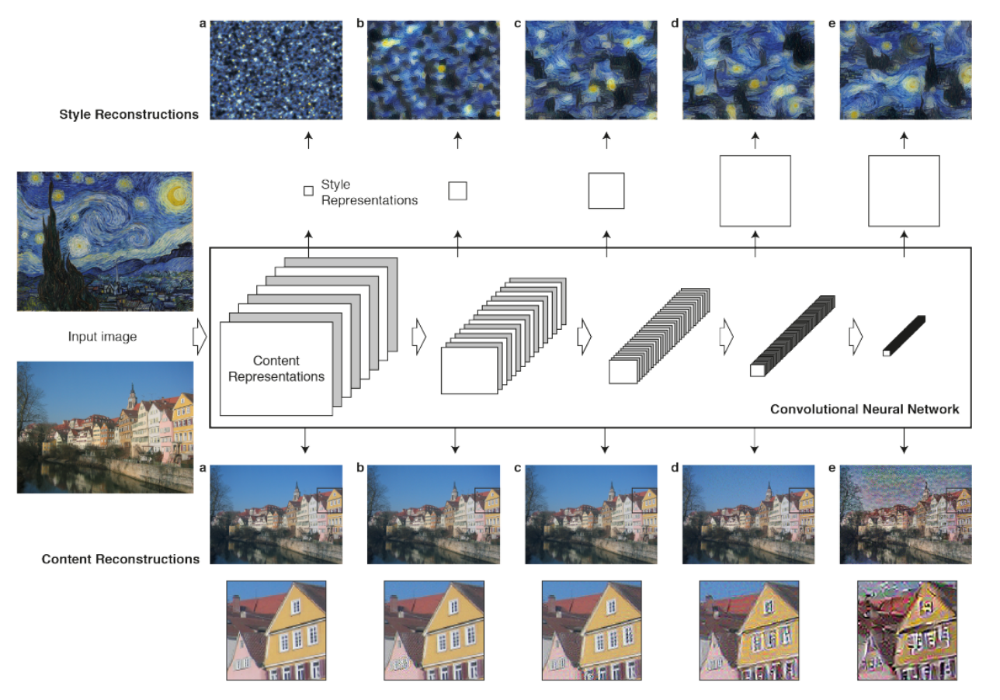

**Как использовать пару изображений**: 

Чтобы при генерации использовать данные с обоих изображений - контента и стиля, нужно определить два разных (!) расстояния (они же будут частями функции потерь) - $D_c$ и $D_s$. Почему разных? Очевидно, что контент и стиль играют разные роли - одно нам надо копировать сюжетно, а у второго взять только общие черты - текстуры/цвета. 

Что означают эти расстояния: 
- $D_s$ будет условно показывать насколько близки стили подаваемых картинок (а на самом деле конволюционные представления на разных этапах), 
- $D_c$ - насколько они близки сюжетно, obviously. 

И чего будем с ними делать? А будем брать нашу входную картинку и **изменять её** таким образом, чтобы расстояния по стилю и контенту стали минимальны. 

**Важное примечание**: в данном случае при оптимизации `loss`-а мы **не будем** менять веса модели - она священна и неизменна, уже прекрасно делает свою работу (позволяет получить представления). Мы меняем сам **вход** модели и оптимизацию проводим именно по его элементам.

**Важное примечание**: в качестве входного изображения можно брать чисто шум, но лучшие и более шустрые результаты получаются если вход = контент + шум. 



**Итак, по пунктикам:**

1. Загружаем изображения стиля и контента, приводим их к одному размеру
2. Берем предобученную нейронную сеть (`VGG16`)
3. Разделим карты признаков - в зависимости от глубины они содержат признаки разной сложности, нам понадобятся несколько из них
4. Формулируем оптимизационную задачу - собираем `loss` из `content` и `style` частей
5. Минимизируем суммарный `loss` по входной картинке


А теперь, чтобы правда понять, что происходит, мы...

### **10.1.2** Кодируем наше решение

In [1]:
import torchvision.transforms as transforms
import torchvision.datasets   as datasets
import torchvision.models     as models
import torch.nn.functional    as F
import matplotlib.pyplot      as plt
import torch.optim            as optim
import torch.nn               as nn

import torch
import copy
import time
import re

from torch.utils.data import DataLoader
from collections      import namedtuple
from PIL              import Image

from tqdm import tqdm_notebook as tqdm

import warnings
warnings.filterwarnings('ignore')

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [2]:
#from google.colab import drive
#drive.mount("/content/drive")

In [3]:
#!cp "/content/drive/MyDrive/Colab Notebooks/OM 2021/10. Style/content.jpeg" .
#!cp "/content/drive/MyDrive/Colab Notebooks/OM 2021/10. Style/mosaic.jpg" .

In [4]:
imsize = (512, 512)

init_transform = transforms.Compose([
 transforms.Resize(imsize), 
 transforms.ToTensor()]
) 

def image_loader(image_name):
    image = Image.open(image_name)
    image = init_transform(image).unsqueeze(0) #делаем из картинки батч размера 1
    return image.to(device, torch.float)


content_img = image_loader("./content.jpeg")
style_img   = image_loader("./mosaic.jpg")

assert style_img.size() == content_img.size(), \
    "we need to import style and content images of the same size"

In [5]:
untransform = transforms.ToPILImage()  

def imshow(tensor, title=None):
    
    image = tensor.cpu().clone()  # для визуализации копируем тензор чтобы не испортить его
    image = image.squeeze(0)      # а 4я размерность стала не нужна
    image = untransform(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.axis('off')

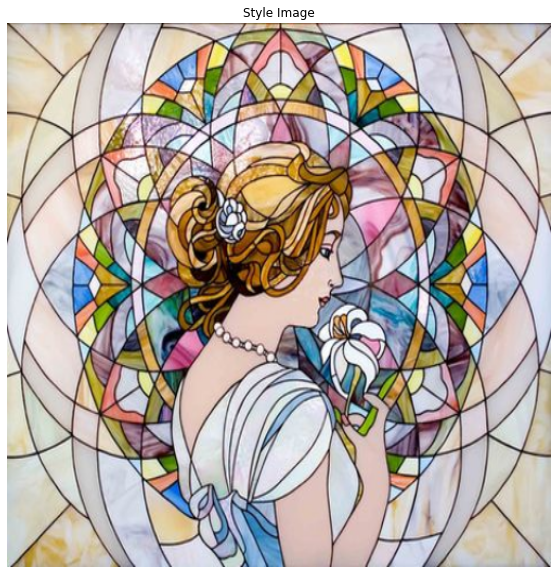

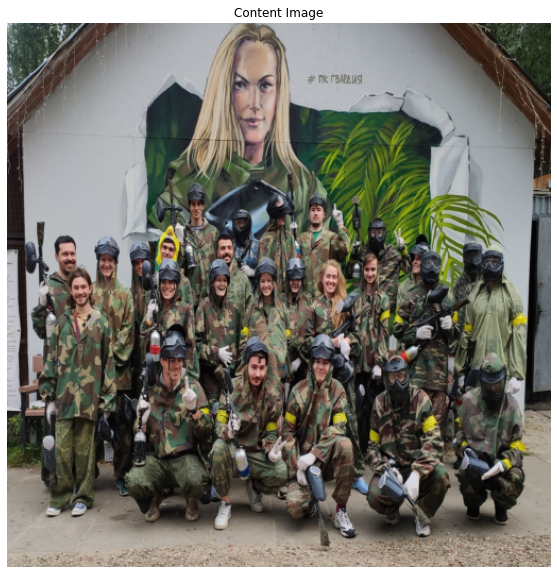

In [6]:
plt.figure(figsize=(10, 10))
imshow(style_img  , title='Style Image'  )
plt.figure(figsize=(10, 10))
imshow(content_img, title='Content Image')

**Функция потерь контента.** 

`ContentLoss`- функция потерь, которая выдает взвешенное контентное расстояние для выхода отдельного слоя модели. На вход она получает `карту признака` входа $X$ со слоя $L$ - $F_{XL}$ и считает расстояние от $X$ до $C$ (в финальном лоссе ещё на вес умножим). Но понятное дело расстояние будем считать не до самой $C$, а до её представления на этом же слое - $F_{CL}$. 

То есть $D_S = ‖F_{XL}−F_{CL}‖^2$ и легко считается с помощью `pytorch`.

В сети для переноса стиля подсчет лосса - операция внутренняя, он считается по ходу движения $X$ через сеть, а значит на выход пойдет просто инпут

In [7]:
class ContentLoss(nn.Module):
    def __init__(self, target):
        super(ContentLoss, self).__init__()
        self.target = target.detach() #detach делаем так как градиенты по контенту считать не будем

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)  
        return input

**Функция потерь стиля.**

`StyleLoss` в целом похож на `ContentLoss` - он тоже будет жить между слоями и считать разницу между $N$-м представлением стиля и входа. Но здесь разницу мы будем считать между матрицами Грама $G_{XL}$. 

Как мы знаем, матрица Грама - это просто произведение $AA^T$. Для нашего кейса будем считать матрицу Грама для решейпнутых представлений $\hat{F}_{XL}$. Зачем она тут? Базово, мы хотим чтобы хорошо воспроизводились корреляции пар фичей, которые мы наблюдаем в картинке стиля.

Как получаем $\hat{F}_{XL}$: $F_{XL}$ мы решейпим к виду $K {\times} N$, где $K$ - число фичамап (каналов) на слое $L$, а $N$ - длина любой векторизованной (`flatten`) фичамапы. То есть каждая строка $\hat{F}_{XLi}$ - это `flatten` $i$-ая фичамапа. 

В конце каждый элемент матрицы Грама надо нормализовать - поделить на число элементов в матрице, так мы не будем иметь проблем ни с какой размерностью фичамап.



In [8]:
def gram_matrix(input):    
    b, c, h, w = input.size()  
    # b = batch size(=1)
    # c = number of feature maps
    # (h, w) = dimensions of a f. map (N=h*w)

    features = input.view(b * c, h * w)  # F_XL -> \hat F_XL
    G = torch.mm(features, features.t())  # считаем матрицу Грама

    return G.div(b * c * h * w) #нормализуем на число объектов

In [9]:
class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

Дальше больше - **работаем с моделью**.

Из нее нам нужно уметь вытаскивать фичамапы на нескольких слоях. А также мы помним, что сеть мы не учим, они всегда будет в `eval mode`. 

In [10]:
cnn = models.vgg16(pretrained=True).features.to(device).eval()

In [11]:
cnn

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

Вид сети у нас так себе - надо либо обращаться прямо по номерам слоев, либо что-то придумывать.

В сеть добавим ещё нормализацию, хотя можно было просто переписать `init_transform` и считать данные заново.

In [12]:
means = torch.tensor([0.485, 0.456, 0.406]).to(device)
stds  = torch.tensor([0.229, 0.224, 0.225]).to(device)

class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # [C x 1 x 1]
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        return (img - self.mean) / self.std

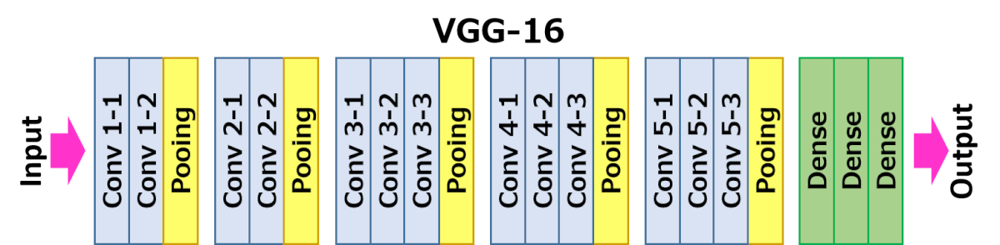

В статье для стиля брали  `conv1_1` `(1)`, `conv2_1` `(3)`, `conv3_1` `(5)`, `conv4_1` `(8)` и `conv5_1` `(11)`, а для контента `conv4_2` `(9)`

In [13]:
# какие нам слои понадобятся
content_layers_default = ['conv_9']
style_layers_default = ['conv_1', 'conv_3', 'conv_5', 'conv_8', 'conv_11']

#функция которая соберет нам модель и первоначальные лоссы для контента и стиля
def get_style_model_and_losses(cnn, norm_mean, norm_std, style_img, content_img,
                               content_layers=content_layers_default, style_layers=style_layers_default):
    cnn = copy.deepcopy(cnn)

    normalization = Normalization(norm_mean, norm_std).to(device)
    
    #будем хранить лоссы
    content_losses = []
    style_losses   = []

    #начали собирать
    model = nn.Sequential(normalization)

    #переименуем слои для наглядности
    i = 0 #будем тут считать блоки по конволюциям
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False) 
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        #дополняем модель - она будет состоять из нормализации и именованных слоев
        model.add_module(name, layer)

        #если мы сейчас на слое по которому штрафуем за контент, то навешиваем лосс
        if name in content_layers:
            # считаем content loss где нужно
            target = model(content_img).detach() #отделяем выход на текущем слое от графа
            content_loss = ContentLoss(target) #считаем по нему лосс
            model.add_module("content_loss_{}".format(i), content_loss) #добавляем в архитектуру лосс
            content_losses.append(content_loss) #положили его в список лоссов контента

        #аналогично со стилем, но здесь уже на 5 слоев будет довесок
        if name in style_layers:
            # считаем style loss где нужно
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss) #положили все лоссы в список

    # обрезаем ненужные слои (по которым мы не считаем лоссы)
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses

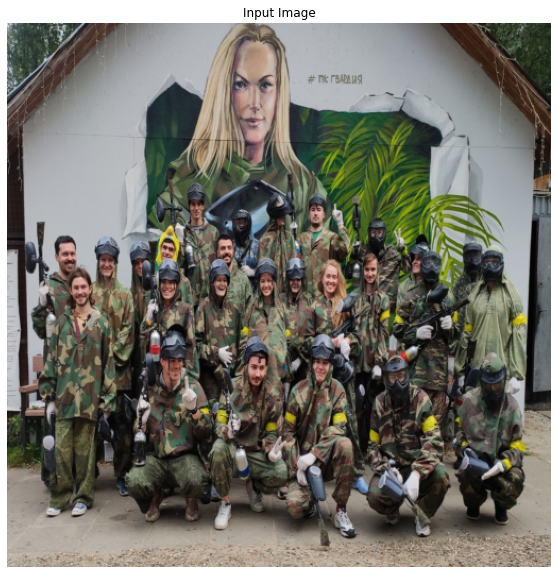

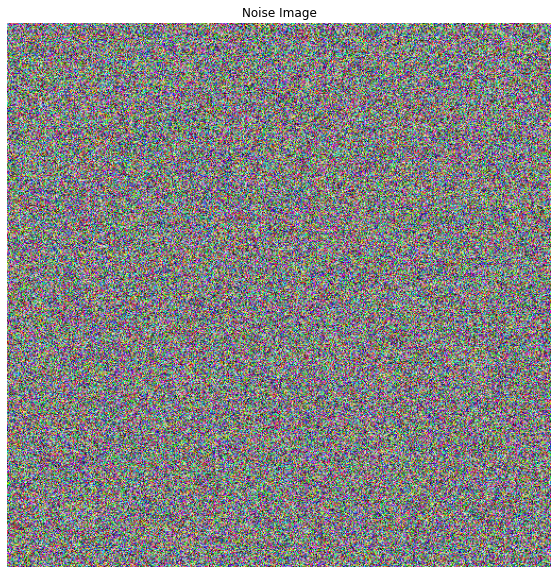

In [14]:
input_img = content_img.clone()
input_img_noise = torch.randn(content_img.data.size(), device=device)

plt.figure(figsize=(10, 10))
imshow(input_img, title='Input Image')

plt.figure(figsize=(10, 10))
imshow(input_img_noise, title='Noise Image')

In [15]:
model, style_losses, content_losses = get_style_model_and_losses(cnn, means, stds, style_img, content_img)

In [16]:
print(content_losses[0].loss        )
print(content_losses[0].target.shape)
print(style_losses  [0].loss        )
print(style_losses  [0].target.shape)

tensor(269.9106, device='cuda:0', grad_fn=<MseLossBackward0>)
torch.Size([1, 512, 64, 64])
tensor(0., device='cuda:0', grad_fn=<MseLossBackward0>)
torch.Size([64, 64])


In [17]:
_ = model(input_img)

In [18]:
print(content_losses[0].loss        )
print(content_losses[0].target.shape)
print(style_losses  [0].loss        )
print(style_losses  [0].target.shape)

tensor(0., device='cuda:0', grad_fn=<MseLossBackward0>)
torch.Size([1, 512, 64, 64])
tensor(8.9299e-05, device='cuda:0', grad_fn=<MseLossBackward0>)
torch.Size([64, 64])


Оптимизация впереди. Гатис рекомендует использовать [LBFGS](https://habr.com/ru/post/333356/), для начала так и сделаем:

In [19]:
def run_style_transfer(cnn, norm_mean, norm_std, content_img, style_img, 
                       input_img, num_steps=300, style_weight=1e6, content_weight=1):
  

    print('Building a model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn, norm_mean, norm_std, style_img, content_img)
    optimizer = optim.LBFGS([input_img.requires_grad_()]) #обратите внимание кому нужен градиент

    print('Optimizing..')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            # correct the values of updated input image
            input_img.data.clamp_(0, 1)

            optimizer.zero_grad() #зануляем градиенты
            model(input_img) #прогоняем картинку через сеть 

            #соберем в этих переменные значения лоссов с разных частей
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            #взвесим
            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % 100 == 0:
                print("run {}:".format(run))
                print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                    style_score.item(), content_score.item()))
                print()

            return style_score + content_score

        optimizer.step(closure)

    input_img.data.clamp_(0, 1)

    return input_img

In [20]:
%%time
output_slow = run_style_transfer(cnn, means, stds, content_img, style_img, input_img, style_weight=1e6)

Building a model..
Optimizing..
run [100]:
Style Loss : 570.412659 Content Loss: 131.442322

run [200]:
Style Loss : 219.121429 Content Loss: 125.549606

run [300]:
Style Loss : 122.995323 Content Loss: 117.603195

CPU times: user 33.8 s, sys: 337 ms, total: 34.2 s
Wall time: 34.3 s


In [21]:
%%time
input_img_noise = torch.randn(content_img.data.size(), device=device)
output_slow_noise = run_style_transfer(cnn, means, stds, content_img, style_img, input_img_noise, style_weight=1e3)

Building a model..
Optimizing..
run [100]:
Style Loss : 12.474778 Content Loss: 20.995203

run [200]:
Style Loss : 10.092578 Content Loss: 15.892563

run [300]:
Style Loss : 9.761302 Content Loss: 14.334900

CPU times: user 33.7 s, sys: 11.2 ms, total: 33.7 s
Wall time: 33.8 s


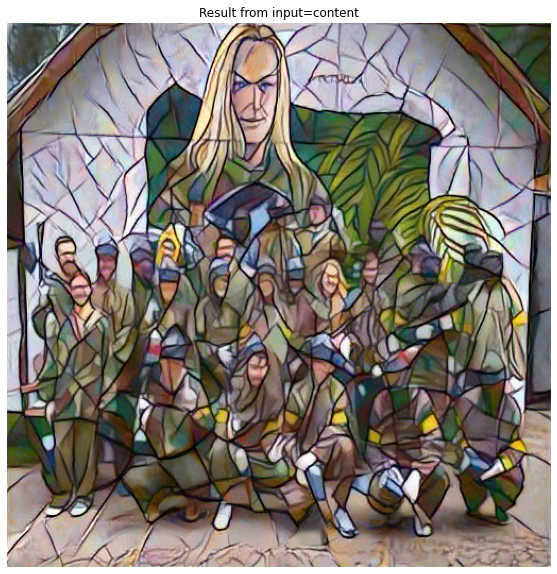

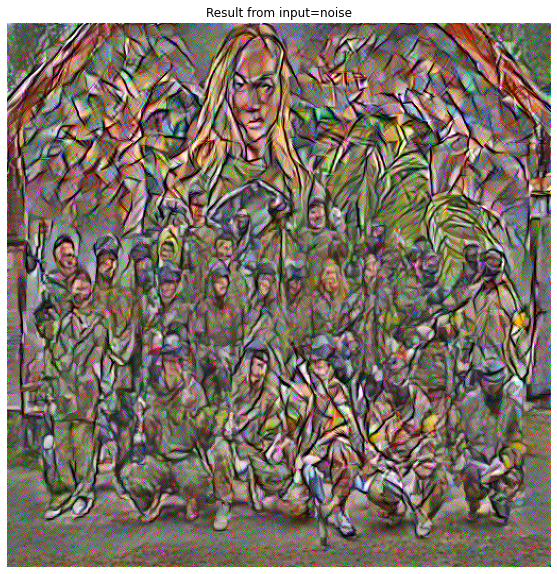

In [22]:
plt.figure(figsize=(10, 10))
imshow(output_slow, title='Result from input=content')
plt.figure(figsize=(10, 10))
imshow(output_slow_noise, title='Result from input=noise')
plt.show()

## **10.2** Быстрый подход (transformation)



**Кратко**: для каждого стиля научим свою `Transform Net`, а `ImageNet`-сеть будем использовать для подсчета `loss` при её обучении `Perceptual Loss`

### **10.2.1** Говорим

Этот подход был предложен в 2016 году Johnson J, Alahi A. и Fei-Fei Li в статье [Perceptual Losses for Real-Time Style Transfer
and Super-Resolution](https://arxiv.org/pdf/1603.08155.pdf). Статья чёткая и довольно простая в понимании, почитайте для закрепления материала.

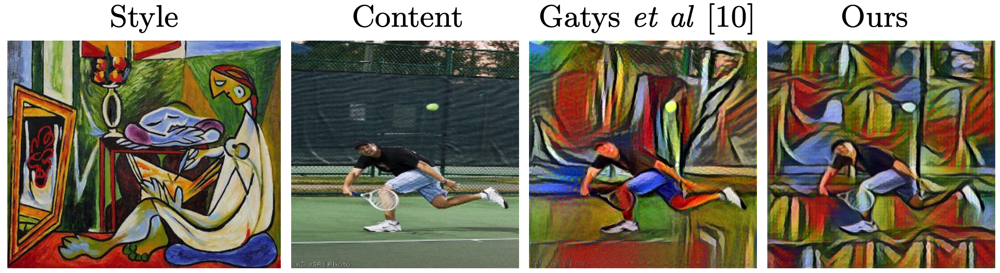

Визуально кажется, что стиль оба подхода передают неплохо, просто по-разному, но основной понт в том, что получаемое ускорение на инференсе - минимум x200. 

Такой подход можно уже использовать в приложениях, которые к нужному вам фото применяют один из заранее выбранных стилей. 

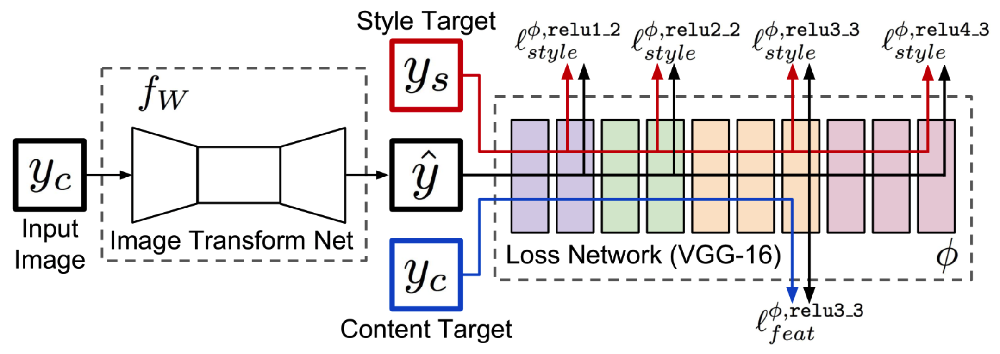

**В чем тут суть?** 

Мы заранее имеем одну картинку стиля, под которую будем выучивать сеть, и какую то выборку визуальных данных, которые можно использовать для обучения (разметки, конечно, никакой нет). 

Сеть мы хотим выучить так, чтобы какой бы ни был инпут, после инференса преобразованная картинка **воспринималась** как имеющая новый стиль. Вот это восприятие стиля картинки и будет делать `ImageNet`-сетка, а такие навороты с восприятием контента и стиля посредством маленького обученного ИИ назвали `Perceptual Loss.`

Лоссы тут на самом деле точно такие же, как мы уже видели - `MSE` между матрицами Грама для стиля, `MSE` попиксельно для представления контента.

**Особенности Transformation Net** (по заветам [статьи](https://arxiv.org/pdf/1511.06434.pdf))

- Архитектура `downsample-upsample`
- Нет `pooling layers` (для `downsamle` иcпользуем `strided conv`)
- `Reflection padding` перед `conv` всегда (чтобы не было артефактов на краях)
- Используются `residual blocks`
- `Instance Normalization`
- Особый `Upsample` (чтобы не было шахматных артефактов)

Здесь в архитектуре сразу используем `Instance Normalization` для улучшения качества, который был предложен в 2016 году господами `Ulyanov D., Lempitsky V., Vedaldi A.` в статье [`Instance Normalization: The Missing Ingredient for Fast Stylization`](https://arxiv.org/pdf/1607.08022.pdf), а код к ней [вот](https://github.com/DmitryUlyanov/texture_nets) (увы, он на lua).

**Зачем down-сэмплить, если потом будем up-сэмплить?** 

Вход и выход у нас одинакового размера, так зачем страдать? Преобразовывали бы входную картинки $C × H × W$ всё время.

А мы уже знаем благодаря UNet, но повторим.

- Вычислительно проще. 3×3 конволюция с $C$ фильтрами на картинке $C × H × W$ - это $9HW C^2$ операций. А это то же самое, что 3 × 3 конволюция с $D*C$ фильтрами на картинке $DC × H/D × W/D$. А значит на тех же затратах мы можем делать сеть глубже и извлекать больше информации из картинки. 
- С понижением размерности, у нас растет `receptive field` сверток, а при стилизации какой-то части изображения, нам нужно знать проиходящее вокруг этой части. Без `downsampling` каждая $3×3$ конволюция увеличивает `receptive field` в 2 раза (это очень маленькие области). При `downsample` в D раз, каждая $3×3$ конволюция на первоначальном изображении имеет  `receptive field` $×2D$, а значит сеть воспринимает одновременно большую часть контекста, при том же числе слоев.


**Instance Normalization**

Сравните доки про [`nn.InstanceNorm2d`](https://pytorch.org/docs/stable/generated/torch.nn.InstanceNorm2d.html) и [`nn.BatchNorm2d`](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm2d.html).

В случае нормализации батча мы считаем `mean/std` по-канально для всего батча и используем общую статистику для всех картинок, в случае нормализации инстанса мы считем `mean/std` по-канально для каждой отдельной картинки в батче, информация между ними не шерится. 

Почему это хорошо? 

К каждой картинке стиль должен применяться **по-своему**, учитывая её уникальный сюжет. Шеринг этих данных внутри батча приводит к единообразию, которое хорошо при классификации, но в искусстве неприменимо.



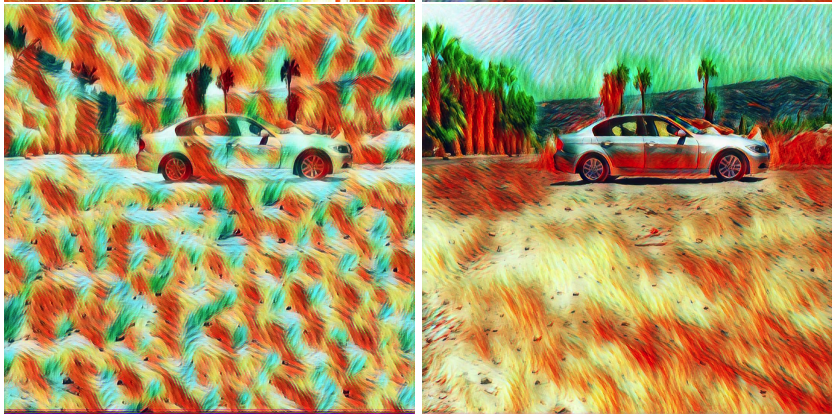

**Upsample trick**

Подробное описание [тут](http://distill.pub/2016/deconv-checkerboard/).

Кратко вспомним: вместо того чтобы выучивать веса для `upsampling` и избегать некратности размера ядра и `stride`, разделим операцию на две части - интерполяцию и конволюцию над ней, это решит проблему.

### **10.2.2** Кодим

[Ссылка](https://drive.google.com/file/d/18C3Exq2G_mh2xteU-J5TfjvK4KPUwt9D/view?usp=sharing) на данные для вас. 


In [23]:
#!unzip  -q "/content/drive/MyDrive/Colab Notebooks/OM 2021/10. Style/Flickr8k.zip"

In [24]:
transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.mul(255))
    ])

style_transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.mul(255))
    ])

In [25]:
#batch_size = 12
batch_size = 4
train_dataset = datasets.ImageFolder('./dataset/Flickr8k', transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size)

In [26]:
class TransformerNet(torch.nn.Module):
  def __init__(self):
      super(TransformerNet, self).__init__()
      # Initial convolution layers
      self.conv1 = ConvLayer(3, 32, kernel_size=9, stride=1)
      self.in1 = torch.nn.InstanceNorm2d(32, affine=True)
      self.conv2 = ConvLayer(32, 64, kernel_size=3, stride=2)
      self.in2 = torch.nn.InstanceNorm2d(64, affine=True)
      self.conv3 = ConvLayer(64, 128, kernel_size=3, stride=2)
      self.in3 = torch.nn.InstanceNorm2d(128, affine=True)
      
      # Residual blocks
      self.res1 = ResidualBlock(128)
      self.res2 = ResidualBlock(128)
      self.res3 = ResidualBlock(128)
      self.res4 = ResidualBlock(128)
      self.res5 = ResidualBlock(128)
      
      # Upsampling 
      self.deconv1 = UpsampleConvLayer(128, 64, kernel_size=3, stride=1, upsample=2)
      self.in4 = torch.nn.InstanceNorm2d(64, affine=True)
      self.deconv2 = UpsampleConvLayer(64, 32, kernel_size=3, stride=1, upsample=2)
      self.in5 = torch.nn.InstanceNorm2d(32, affine=True)
      self.deconv3 = ConvLayer(32, 3, kernel_size=9, stride=1)
      
      # нелинейность везде одна
      self.relu = torch.nn.ReLU()

  def forward(self, X):
      y = self.relu(self.in1(self.conv1(X)))
      y = self.relu(self.in2(self.conv2(y)))
      y = self.relu(self.in3(self.conv3(y)))
      
      y = self.res1(y)
      y = self.res2(y)
      y = self.res3(y)
      y = self.res4(y)
      y = self.res5(y)
      
      y = self.relu(self.in4(self.deconv1(y)))
      y = self.relu(self.in5(self.deconv2(y)))
      y = self.deconv3(y)
      return y


class ConvLayer(torch.nn.Module):
  def __init__(self, in_channels, out_channels, kernel_size, stride):
      super(ConvLayer, self).__init__()
      reflection_padding = kernel_size // 2
      self.reflection_pad = torch.nn.ReflectionPad2d(reflection_padding)
      self.conv2d = torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride)

  def forward(self, x):
      out = self.reflection_pad(x)
      out = self.conv2d(out)
      return out


class ResidualBlock(torch.nn.Module):
  def __init__(self, channels):
      super(ResidualBlock, self).__init__()
      self.conv1 = ConvLayer(channels, channels, kernel_size=3, stride=1)
      self.in1 = torch.nn.InstanceNorm2d(channels, affine=True)
      self.conv2 = ConvLayer(channels, channels, kernel_size=3, stride=1)
      self.in2 = torch.nn.InstanceNorm2d(channels, affine=True)
      self.relu = torch.nn.ReLU()

  def forward(self, x):
      residual = x
      out = self.relu(self.in1(self.conv1(x)))
      out = self.in2(self.conv2(out))
      out = out + residual #skip
      return out


class UpsampleConvLayer(torch.nn.Module):
  def __init__(self, in_channels, out_channels, kernel_size, stride, upsample=None):
      super(UpsampleConvLayer, self).__init__()
      self.upsample = upsample
      reflection_padding = kernel_size // 2
      self.reflection_pad = torch.nn.ReflectionPad2d(reflection_padding)
      self.conv2d = torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride)

  def forward(self, x):
      x_in = x
      if self.upsample:
          x_in = torch.nn.functional.interpolate(x_in, mode='nearest', scale_factor=self.upsample)
      out = self.reflection_pad(x_in)
      out = self.conv2d(out)
      return out

In [27]:
class vgg16_loss(torch.nn.Module):
    def __init__(self, requires_grad=False):
        super(vgg16_loss, self).__init__()
        
        vgg_pretrained_features = models.vgg16(pretrained=True).features
        self.slice1 = torch.nn.Sequential()
        self.slice2 = torch.nn.Sequential()
        self.slice3 = torch.nn.Sequential()
        self.slice4 = torch.nn.Sequential()
        for x in range(4):
            self.slice1.add_module(str(x), vgg_pretrained_features[x])
        for x in range(4, 9):
            self.slice2.add_module(str(x), vgg_pretrained_features[x])
        for x in range(9, 16):
            self.slice3.add_module(str(x), vgg_pretrained_features[x])
        for x in range(16, 23):
            self.slice4.add_module(str(x), vgg_pretrained_features[x])
        
        if not requires_grad:
            for param in self.parameters():
                param.requires_grad = False

    def forward(self, X):
        h = self.slice1(X)
        h_relu1_2 = h
        h = self.slice2(h)
        h_relu2_2 = h
        h = self.slice3(h)
        h_relu3_3 = h
        h = self.slice4(h)
        h_relu4_3 = h
        vgg_outputs = namedtuple("VggOutputs", ['relu1_2', 'relu2_2', 'relu3_3', 'relu4_3'])
        out = vgg_outputs(h_relu1_2, h_relu2_2, h_relu3_3, h_relu4_3)
        return out

In [28]:
#это понадобится только для прохода через vgg
def normalize_for_vgg(batch):
    mean = batch.new_tensor([0.485, 0.456, 0.406]).view(-1, 1, 1)
    std = batch.new_tensor([0.229, 0.224, 0.225]).view(-1, 1, 1)
    batch = batch.div(255.0)
    return (batch - mean) / std

In [29]:
#основная сеть и оптимайзер
transformer = TransformerNet().to(device)
optimizer = optim.Adam(transformer.parameters(), 1e-3)

#всё что у нас будет нужно для лосса
vgg = vgg16_loss(requires_grad=False).to(device)
mse_loss = nn.MSELoss()

In [30]:
#Читаем картинку стиля под которую будем учить сеть
style_img = Image.open('./mosaic.jpg').convert('RGB')
style_img = style_transform(style_img)
style_img = style_img.repeat(batch_size, 1, 1, 1).to(device) #раздублируем её для каждой картинки в батче
print(style_img.shape)

torch.Size([4, 3, 391, 470])


In [31]:
features_style = vgg(normalize_for_vgg(style_img))

for f in features_style:
    print(f.shape)

torch.Size([4, 64, 391, 470])
torch.Size([4, 128, 195, 235])
torch.Size([4, 256, 97, 117])
torch.Size([4, 512, 48, 58])


In [32]:
#новая функция для работы с батчем
def gram_matrix_batch(y):
    (b, ch, h, w) = y.size()
    features = y.view(b, ch, w * h) #вытягиваем пространственную размерность в вектор
    features_t = features.transpose(1, 2) #транспонируем
    gram = features.bmm(features_t) / (ch * h * w) #batch matrix mul
    return gram

In [33]:
#Один раз считаем представления стиля с помощью vgg
gram_style = [gram_matrix_batch(f) for f in features_style]

for G in gram_style:
  print(G.shape)

torch.Size([4, 64, 64])
torch.Size([4, 128, 128])
torch.Size([4, 256, 256])
torch.Size([4, 512, 512])


In [34]:
epochs = 2 #~15 минут на эпоху
content_weight = 1e5
style_weight = 1e10

In [35]:
%%time
for epoch in range(epochs):
    transformer.train()
    vgg.eval()
    
    agg_content_loss = 0.
    agg_style_loss = 0.
    count = 0

    for batch_id, (x, _) in enumerate(train_loader):
        n_batch = len(x)
        count += n_batch
        optimizer.zero_grad()

        x = x.to(device) #это наш контент
        y = transformer(x) #это преобразованное изображение

        #теперь делаем нормализацию для vgg
        x = normalize_for_vgg(x)
        y = normalize_for_vgg(y)
        
        features_y = vgg(y) #представления для преобразованного x
        features_x = vgg(x) #представления для самого x

        #представление контента с одной фича мапы
        content_loss = content_weight * mse_loss(features_y.relu2_2, features_x.relu2_2)

        #для стиля со всех 4х
        style_loss = 0.
        for ft_y, gm_s in zip(features_y, gram_style):
            gm_y = gram_matrix_batch(ft_y)
            style_loss += mse_loss(gm_y, gm_s[:n_batch, :, :])

        style_loss *= style_weight

        total_loss = content_loss + style_loss
        total_loss.backward()
        optimizer.step()

        agg_content_loss += content_loss.item()
        agg_style_loss += style_loss.item()

        if (batch_id + 1) % 100 == 0:
            mesg = "{} Epoch {}: [{}/{}] content: {:.6f} style: {:.6f} total: {:.6f}".format(
                time.ctime(), epoch + 1, count, len(train_dataset),
                              agg_content_loss / (batch_id + 1),
                              agg_style_loss / (batch_id + 1),
                              (agg_content_loss + agg_style_loss) / (batch_id + 1))
            print(mesg)

Fri Nov 24 23:32:51 2023 Epoch 1: [400/8091] content: 1030811.750938 style: 13975577.010000 total: 15006388.760938
Fri Nov 24 23:33:18 2023 Epoch 1: [800/8091] content: 1247562.936719 style: 9624202.296250 total: 10871765.232969
Fri Nov 24 23:33:45 2023 Epoch 1: [1200/8091] content: 1344072.016563 style: 7283739.457083 total: 8627811.473646
Fri Nov 24 23:34:14 2023 Epoch 1: [1600/8091] content: 1404537.927109 style: 5903334.606562 total: 7307872.533672
Fri Nov 24 23:34:41 2023 Epoch 1: [2000/8091] content: 1449813.930437 style: 4990469.200250 total: 6440283.130688
Fri Nov 24 23:35:13 2023 Epoch 1: [2400/8091] content: 1477423.496406 style: 4335379.225417 total: 5812802.721823
Fri Nov 24 23:35:47 2023 Epoch 1: [2800/8091] content: 1495360.935491 style: 3839457.885268 total: 5334818.820759
Fri Nov 24 23:36:23 2023 Epoch 1: [3200/8091] content: 1506573.851992 style: 3454079.769453 total: 4960653.621445
Fri Nov 24 23:36:59 2023 Epoch 1: [3600/8091] content: 1512879.543160 style: 3147416.84

In [36]:
content_image = Image.open('./content.jpeg').convert('RGB')    
content_image = style_transform(content_image)
content_image = content_image.unsqueeze(0).to(device)
print(content_image.shape)

torch.Size([1, 3, 1943, 2560])


In [39]:
%%time
with torch.no_grad():
  output_fast = transformer(content_image).cpu()

output_fast = output_fast.squeeze(0).clamp(0, 255).numpy()
output_fast = output_fast.transpose(1, 2, 0).astype("uint8")

OutOfMemoryError: CUDA out of memory. Tried to allocate 608.00 MiB. GPU 0 has a total capacty of 5.80 GiB of which 96.25 MiB is free. Including non-PyTorch memory, this process has 5.69 GiB memory in use. Of the allocated memory 3.93 GiB is allocated by PyTorch, and 682.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

NameError: name 'output_fast' is not defined

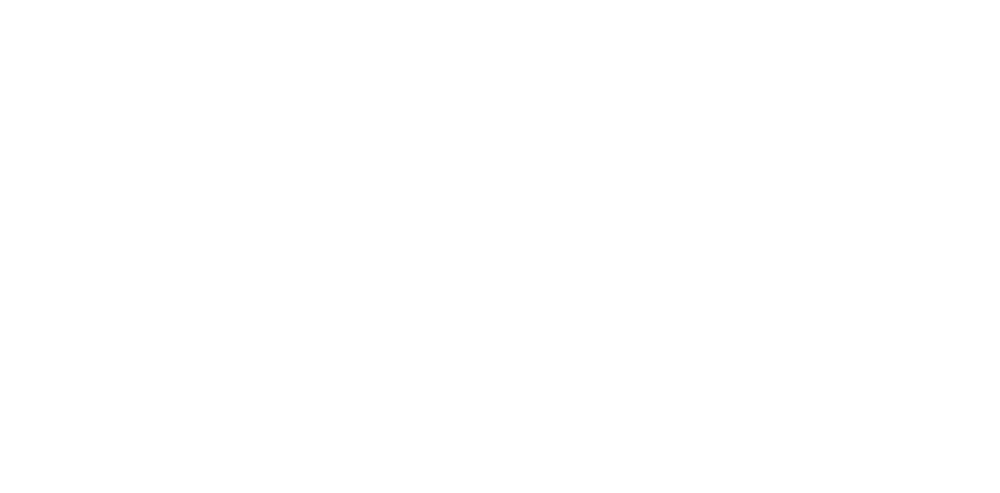

In [38]:
fig = plt.figure(figsize=(20, 10))
plt.axis('off')
plt.imshow(output_fast)
fig = plt.figure(figsize=(7, 7))
plt.axis('off')
imshow(output_slow)

Есть ещё [готовые веса](https://drive.google.com/file/d/1Mg1zGgXUiNW7z3HNI39mzLdYYcPuVdfQ/view?usp=sharing) с обучения на COCO:

In [ ]:
!cp "/content/drive/MyDrive/Colab Notebooks/OM 2021/10. Style/mosaic.pth" .

In [ ]:
with torch.no_grad():
    state_dict = torch.load('./mosaic.pth')
    for k in list(state_dict.keys()):
      if re.search(r'in\d+\.running_(mean|var)$', k):
          del state_dict[k]
    transformer.load_state_dict(state_dict)
    output_fast = transformer(content_image).cpu()

output_fast = output_fast.squeeze(0).clamp(0, 255).numpy()
output_fast = output_fast.transpose(1, 2, 0).astype("uint8")

In [ ]:
fig = plt.figure(figsize=(20, 10))
plt.axis('off')
plt.imshow(output_fast)
#fig = plt.figure(figsize=(7, 7))
#imshow(output_slow)

## **10.3** Take-home tasks




- Почитайте статьи, указанные в семинаре, они не мозговыносящие
- Попробуйте в `Transform Net` заменить `Instance Norm -> Batch Norm`, правда ли `Instance` дает существенно лучшие результаты? 
- В `optimization` подходе попробуйте брать `content loss` не с `conv4_2`, а с `conv1_2`, как изменится перенос стиля? 
- В `transformation` подходе попробуйте брать `content loss` не с `conv2_2`, а с `conv3_3` как нарисовано
- Там же проверьте правда ли `L-BFGS-B` работает круче `Adam`. 
- Для обоих методов попробуйте разное соотношение весов лоссов 


**GL, HF**